In [2]:
exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionSpectralLearningCurve/"

In [6]:
from torchvision.utils import make_grid
from torchvision.transforms import ToPILImage
from os.path import join
import pickle as pkl
from tqdm.auto import tqdm, trange
import sys
sys.path.append("/n/home12/binxuwang/Github/DiffusionLearningCurve")
from core.dataset_lib import load_dataset
from core.img_patch_stats_analysis_lib import compute_crossing_points, sweep_and_create_sample_store, process_img_mean_cov_statistics,\
     process_patch_mean_cov_statistics, plot_variance_trajectories, plot_mean_deviation_trajectories, \
     harmonic_mean, smooth_and_find_threshold_crossing
from core.trajectory_convergence_lib import analyze_and_plot_variance
from circuit_toolkit.plot_utils import saveallforms, to_imgrid

In [ ]:
# sample_store = pickle.load(open(join(exproot, "FFHQ32_DiT_P4_384D_6H_6L_EDM_pilot", "sample_store.pkl"), "rb"))
imgsize = 32

In [8]:
expname = "FFHQ32_DiT_P4_384D_6H_6L_EDM_pilot"
sample_dir = join(exproot, expname, "samples")
sample_store = sweep_and_create_sample_store(sample_dir)

  0%|          | 0/494 [00:00<?, ?it/s]

In [16]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import math

In [27]:
import re
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import math
from glob import glob
def sweep_and_create_sample_store_sparse(sampledir, step_list=[]):
    """
    Sweeps through the sample directory and loads samples.

    Args:
        sampledir (str): Directory containing sample files.

    Returns:
        dict: Dictionary with epochs as keys and loaded samples as values.
    """
    # sample_paths = sorted(glob(join(sampledir, "samples_epoch_*.pt")), key=lambda x: int(re.findall(r'\d+', x)[0]))
    filename = "samples_epoch_{:06d}.pt"
    sample_store = {}
    for step in tqdm(step_list):
        sample_path = join(sampledir, filename.format(step))
        if not os.path.exists(sample_path):
            print(f"Warning: {sample_path} does not exist")
            continue
        sample_store[step] = torch.load(sample_path)
    return sample_store

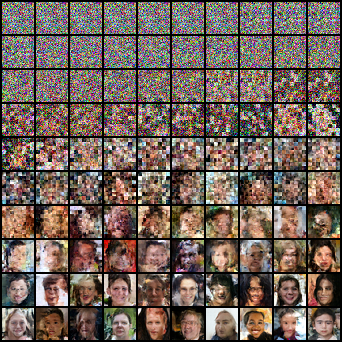

In [19]:
# Function to find the closest step in sample_store
imgsize = 32
def find_closest_step(target_step, available_steps):
    return min(available_steps, key=lambda x: abs(x - target_step))
available_steps = list(sample_store.keys())
steps = np.logspace(np.log10(1), np.log10(50000), 100).astype(int)#[1, 2, 5, 10, 25, 50, 100, 250, 500, 1000, 2500, 5000, 10000, 25000, 50000]
steps = [find_closest_step(step, available_steps) for step in steps]
sample_collection = []
for step in steps:
    # Create a grid of samples
    samples_temp = sample_store[step][1:2].view(-1, 3, imgsize, imgsize)
    samples_temp = ((samples_temp + 1) / 2).clamp(0, 1)
    sample_collection.append(samples_temp)
    
sample_collection = torch.cat(sample_collection, dim=0)
montage = make_grid(sample_collection, nrow=10)
mtg = ToPILImage()(montage)
mtg

In [30]:

def find_closest_step(target_step, available_steps):
    return min(available_steps, key=lambda x: abs(x - target_step))

imgsize = 32
available_steps = list(sample_store.keys())
steps2show = np.logspace(np.log10(1), np.log10(50000), 100).astype(int)#[1, 2, 5, 10, 25, 50, 100, 250, 500, 1000, 2500, 5000, 10000, 25000, 50000]
steps2show = [find_closest_step(step, available_steps) for step in steps2show]

In [45]:
def create_sample_montage(sample_store, steps, imgsize=32, nrow=None, index=1):
    """
    Create a montage of samples from different training steps.
    
    Args:
        sample_store: Dictionary with steps as keys and samples as values
        steps: List of steps to include in the montage
        imgsize: Size of each image
        nrow: Number of images per row in the montage
        
    Returns:
        PIL Image of the montage
    """
    # Create a grid of samples
    sample_collection = []
    for step in steps:
        if step not in sample_store:
            continue
        samples_temp = sample_store[step][index:index+1]
        if samples_temp.ndim == 2:
            samples_temp = samples_temp.view(1, -1, imgsize, imgsize)
        samples_temp = ((samples_temp + 1) / 2).clamp(0, 1)
        sample_collection.append(samples_temp)
    
    sample_collection = torch.cat(sample_collection, dim=0)
    if nrow is None:
        nrow = int(np.sqrt(sample_collection.shape[0]))
    montage = make_grid(sample_collection, nrow=nrow)
    mtg = ToPILImage()(montage)
    return mtg


  0%|          | 0/100 [00:00<?, ?it/s]

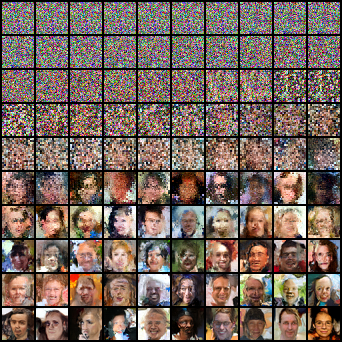

In [37]:
expname = "FFHQ32_DiT_P2_384D_6H_6L_EDM_pilot"
sample_dir = join(exproot, expname, "samples")
sample_store_sparse = sweep_and_create_sample_store_sparse(sample_dir, steps2show)
# Create the montage using the function
mtg = create_sample_montage(sample_store_sparse, steps2show, index=2)
mtg

In [39]:
!ls {join(exproot, )}

AFHQ32_DiT_P2_192D_3H_6L_EDM_pilot
AFHQ32_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm
AFHQ32_UNet_MLP_EDM_8L_3072D_lr1e-4
AFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm
CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm
CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm_smalllr
CIFAR_DiT_P2_192D_3H_6L_EDM_pilot
CIFAR_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm
CIFAR_UNet_MLP_EDM_8L_3072D_lr1e-4
demo_edm_sampler_star_shape.pdf
demo_edm_sampler_star_shape.png
FFHQ32_DiT_P2_192D_3H_6L_EDM_pilot
FFHQ32_DiT_P2_384D_6H_6L_EDM_pilot
FFHQ32_DiT_P2_768D_12H_12L_EDM_pilot
FFHQ32_DiT_P2_768D_12H_6L_EDM_pilot
FFHQ32_DiT_P4_384D_6H_6L_EDM_pilot
FFHQ32_DiT_P4_768D_12H_12L_EDM_pilot
FFHQ32_DiT_P4_768D_12H_6L_EDM_pilot
FFHQ32_fix_words_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm
FFHQ32_fix_words_UNet_MLP_EDM_8L_3072D_lr1e-4
FFHQ32_random_words_jitter_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm
FFHQ32_random_words_jitter_UNet_MLP_EDM_8L_3072D_lr1e-4
FFHQ32_U

  0%|          | 0/100 [00:00<?, ?it/s]

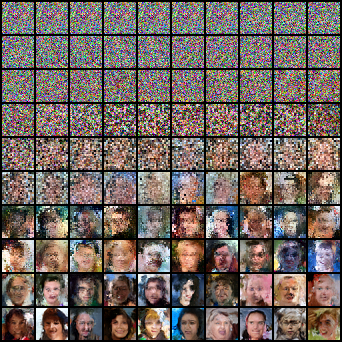

  0%|          | 0/100 [00:00<?, ?it/s]

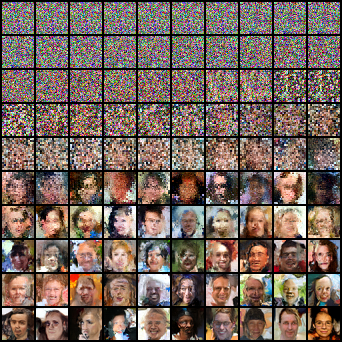

  0%|          | 0/100 [00:00<?, ?it/s]

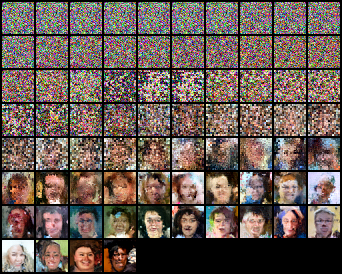

  0%|          | 0/100 [00:00<?, ?it/s]

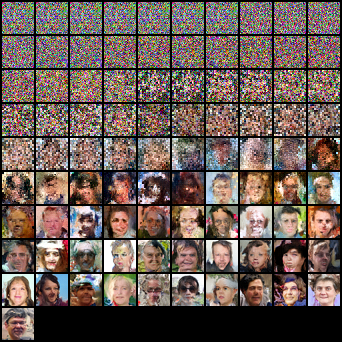

  0%|          | 0/100 [00:00<?, ?it/s]

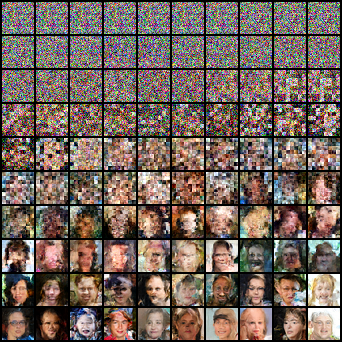

  0%|          | 0/100 [00:00<?, ?it/s]

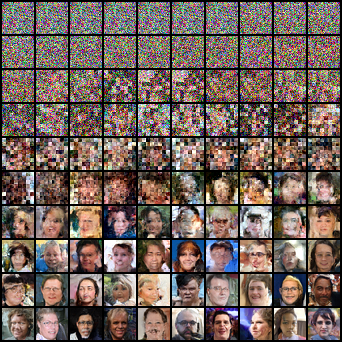

  0%|          | 0/100 [00:00<?, ?it/s]

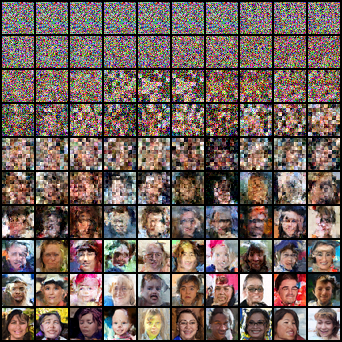

  0%|          | 0/100 [00:00<?, ?it/s]

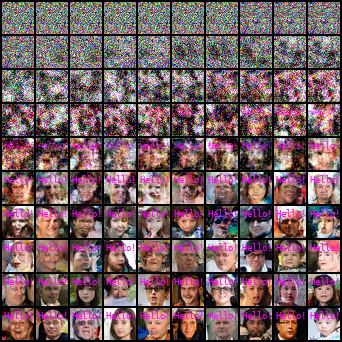

  0%|          | 0/100 [00:00<?, ?it/s]

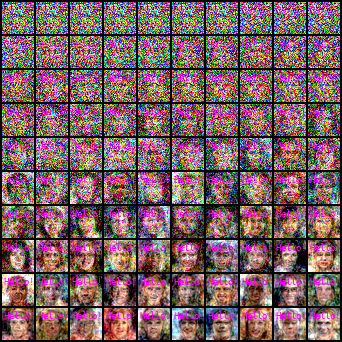

  0%|          | 0/100 [00:00<?, ?it/s]

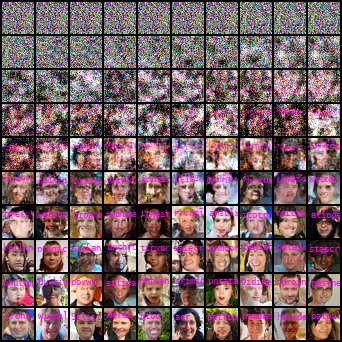

  0%|          | 0/100 [00:00<?, ?it/s]

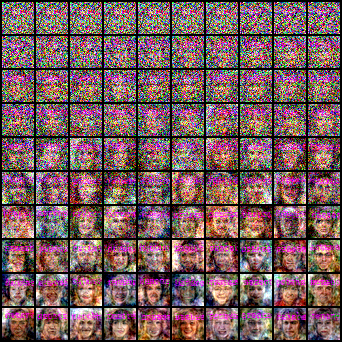

  0%|          | 0/100 [00:00<?, ?it/s]

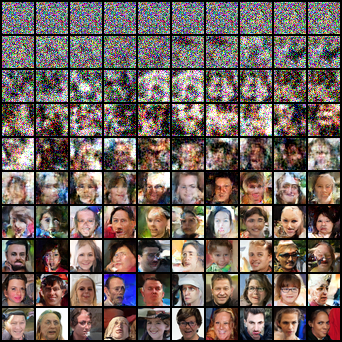

  0%|          | 0/100 [00:00<?, ?it/s]

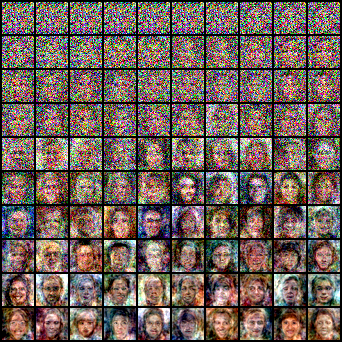

  0%|          | 0/100 [00:00<?, ?it/s]

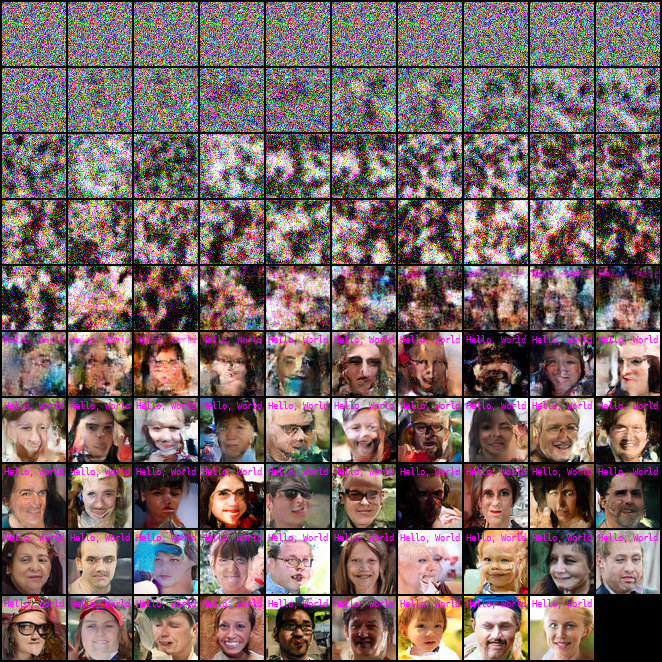

  0%|          | 0/100 [00:00<?, ?it/s]

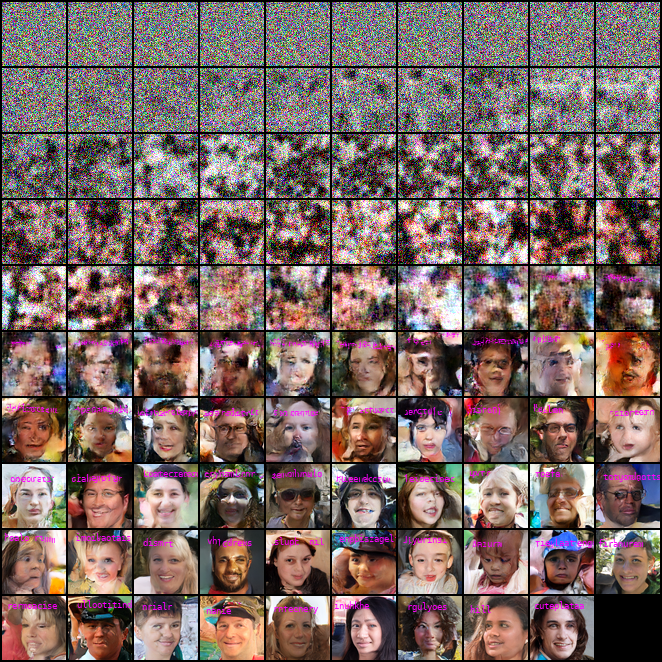

  0%|          | 0/100 [00:00<?, ?it/s]

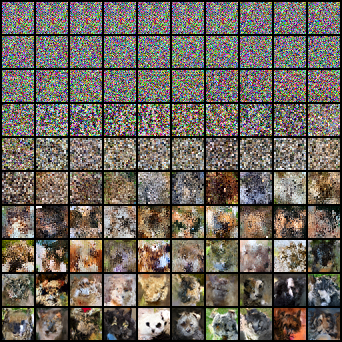

  0%|          | 0/100 [00:00<?, ?it/s]

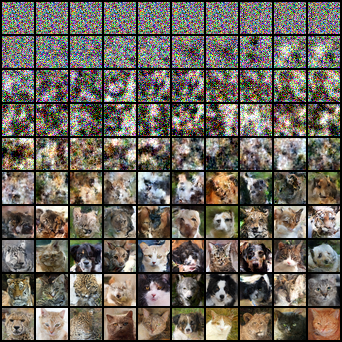

  0%|          | 0/100 [00:00<?, ?it/s]

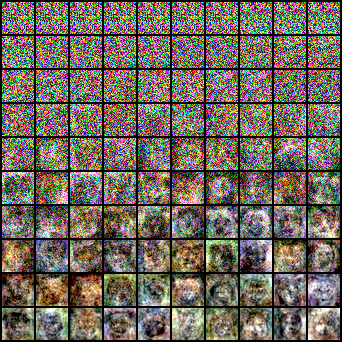

  0%|          | 0/100 [00:00<?, ?it/s]

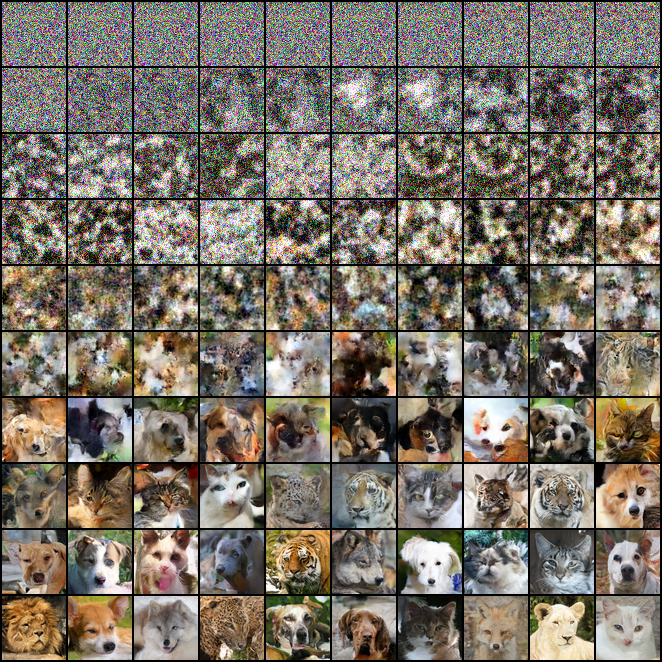

  0%|          | 0/100 [00:00<?, ?it/s]

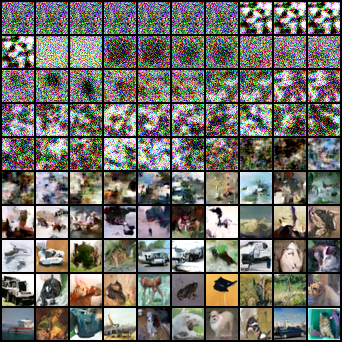

  0%|          | 0/100 [00:00<?, ?it/s]

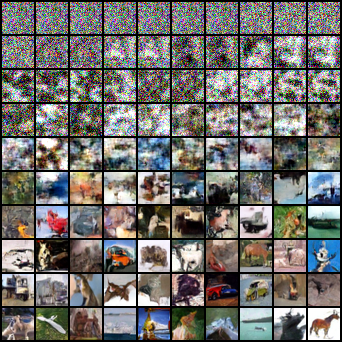

  0%|          | 0/100 [00:00<?, ?it/s]

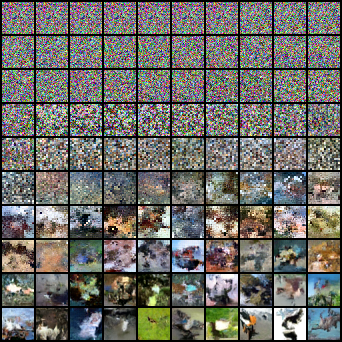

  0%|          | 0/100 [00:00<?, ?it/s]

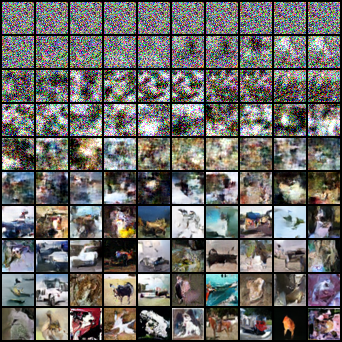

  0%|          | 0/100 [00:00<?, ?it/s]

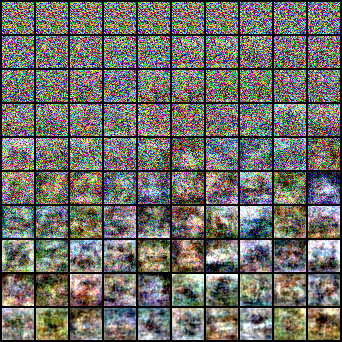

In [50]:
experiment_names = [
    "FFHQ32_DiT_P2_192D_3H_6L_EDM_pilot",
    "FFHQ32_DiT_P2_384D_6H_6L_EDM_pilot",
    "FFHQ32_DiT_P2_768D_12H_12L_EDM_pilot",
    "FFHQ32_DiT_P2_768D_12H_6L_EDM_pilot",
    "FFHQ32_DiT_P4_384D_6H_6L_EDM_pilot",
    "FFHQ32_DiT_P4_768D_12H_12L_EDM_pilot",
    "FFHQ32_DiT_P4_768D_12H_6L_EDM_pilot",
    "FFHQ32_fix_words_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "FFHQ32_fix_words_UNet_MLP_EDM_8L_3072D_lr1e-4",
    "FFHQ32_random_words_jitter_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "FFHQ32_random_words_jitter_UNet_MLP_EDM_8L_3072D_lr1e-4",
    "FFHQ32_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "FFHQ32_UNet_MLP_EDM_8L_3072D_lr1e-4",
    "FFHQ_fix_words_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "FFHQ_random_words_jitter_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "AFHQ32_DiT_P2_192D_3H_6L_EDM_pilot",
    "AFHQ32_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "AFHQ32_UNet_MLP_EDM_8L_3072D_lr1e-4",
    "AFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm",
    "CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm",
    "CIFAR10_UNet_CNN_EDM_3blocks_wide128_attn_pilot_fixednorm_smalllr",
    "CIFAR_DiT_P2_192D_3H_6L_EDM_pilot",
    "CIFAR_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "CIFAR_UNet_MLP_EDM_8L_3072D_lr1e-4",
    
]


synopsis_dir = join(exproot, "synopsis")
os.makedirs(synopsis_dir, exist_ok=True)
for expname in experiment_names:
    sample_dir = join(exproot, expname, "samples")
    sample_store_sparse = sweep_and_create_sample_store_sparse(sample_dir, steps2show)
    # Create the montage using the function
    mtg = create_sample_montage(sample_store_sparse, steps2show, index=2, nrow=10)
    display(mtg)
    mtg.save(join(synopsis_dir, f"{expname}_train_trajectory.png"))

  0%|          | 0/100 [00:00<?, ?it/s]

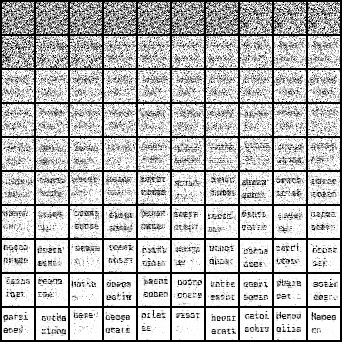

  0%|          | 0/100 [00:00<?, ?it/s]

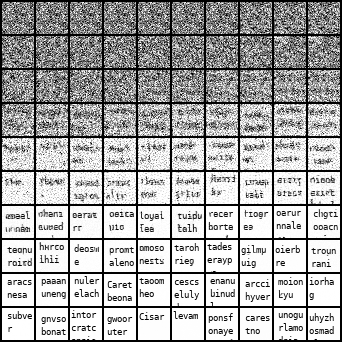

  0%|          | 0/100 [00:00<?, ?it/s]

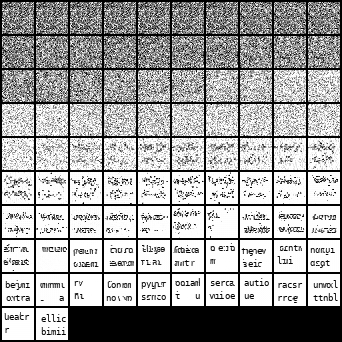

  0%|          | 0/100 [00:00<?, ?it/s]

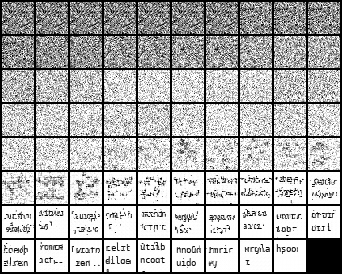

In [51]:
experiment_names = [
    "words32x32_50k_UNet_MLP_EDM_8L_1536D_lr1e-4",
    "words32x32_50k_UNet_CNN_EDM_4blocks_noattn",
    "words32x32_50k_DiT_P2_384D_6H_6L_EDM_pilot",
    "words32x32_50k_DiT_P4_768D_12H_12L_EDM_pilot",
]

synopsis_dir = join(exproot, "synopsis")
os.makedirs(synopsis_dir, exist_ok=True)
for expname in experiment_names:
    sample_dir = join(exproot, expname, "samples")
    sample_store_sparse = sweep_and_create_sample_store_sparse(sample_dir, steps2show)
    # Create the montage using the function
    mtg = create_sample_montage(sample_store_sparse, steps2show, index=2, nrow=10)
    display(mtg)
    mtg.save(join(synopsis_dir, f"{expname}_train_trajectory.png"))

  0%|          | 0/100 [00:00<?, ?it/s]

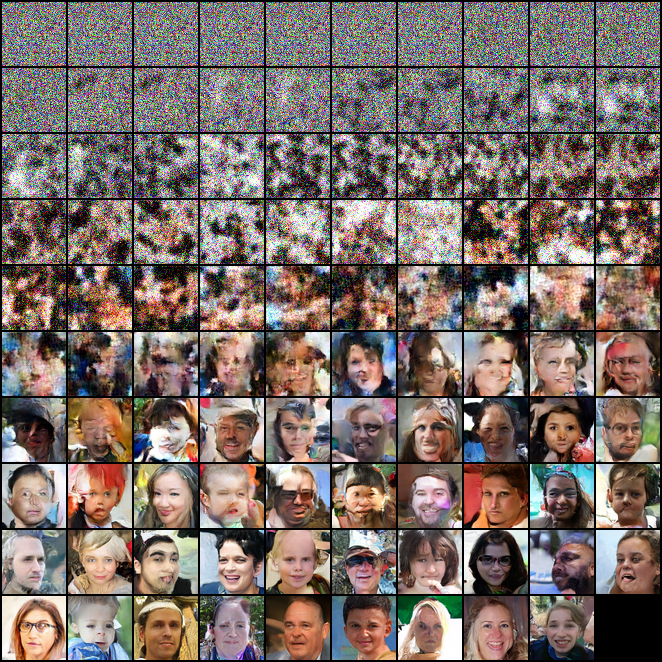

  0%|          | 0/100 [00:00<?, ?it/s]

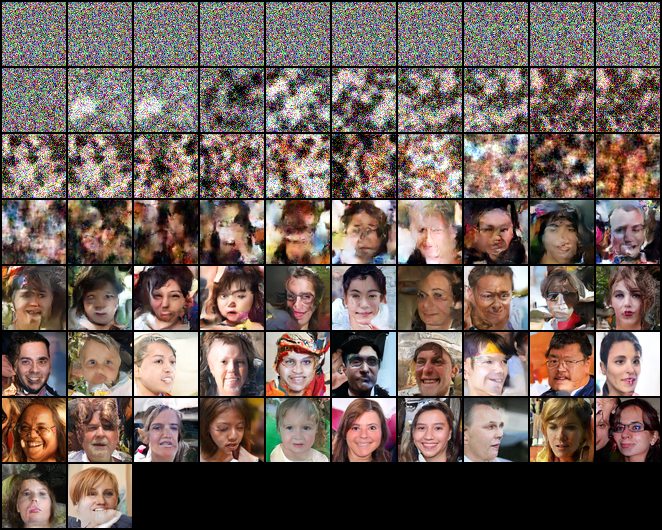

In [49]:
experiment_names = [
    "FFHQ_UNet_CNN_EDM_4blocks_wide128_attn_pilot_fixednorm",
    "FFHQ_UNet_CNN_EDM_4blocks_wide64_attn_pilot_fixednorm",
]

synopsis_dir = join(exproot, "synopsis")
os.makedirs(synopsis_dir, exist_ok=True)
for expname in experiment_names:
    sample_dir = join(exproot, expname, "samples")
    sample_store_sparse = sweep_and_create_sample_store_sparse(sample_dir, steps2show)
    # Create the montage using the function
    mtg = create_sample_montage(sample_store_sparse, steps2show, index=2, nrow=10)
    display(mtg)
    mtg.save(join(synopsis_dir, f"{expname}_train_trajectory.png"))


In [ ]:
expname = "FFHQ32_DiT_P2_384D_6H_6L_EDM_pilot"
sample_dir = join(exproot, expname, "samples")
sample_store_sparse = sweep_and_create_sample_store_sparse(sample_dir, steps2show)
# Create the montage using the function
mtg = create_sample_montage(sample_store_sparse, steps2show, index=2)
mtg

In [ ]:
steps = [1, 2, 5, 10, 25, 50, 100, 250, 500, 1000, 2500, 5000, 10000, 25000, 50000]
# Create a directory for saving figures
import os
figdir = join(exproot, expname, "figures")
os.makedirs(figdir, exist_ok=True)


# Display samples at specified steps (or closest available steps)
for step in steps:
    if step not in sample_store:
        closest_step = find_closest_step(step, sample_store.keys())
        print(f"Step {step} not in sample store, using closest step {closest_step}")
        step = closest_step
    else:
        print(f"Processing step {step}, shape: {sample_store[step].shape}")
    
    # Create a grid of samples
    samples_temp = sample_store[step][:16].view(-1, 3, imgsize, imgsize)
    samples_temp = ((samples_temp + 1) / 2).clamp(0, 1)
    montage = make_grid(samples_temp, nrow=4)
    
    # Display the grid
    plt.figure(figsize=(10, 10))
    plt.imshow(montage.permute(1, 2, 0).cpu().numpy())
    plt.title(f"Samples at step {step}")
    plt.axis('off')
    plt.show()



In [ ]:
steps = [1, 5, 10, 50, 100, 500, 1500, 5000, 10000, 50000]
for step in steps:
    if step not in sample_store:
        print(f"Step {step} not in sample store")
        continue
    print(f"Processing step {step}, shape: {sample_store[step].shape}")
    
    # Create single image sample
    samples_temp = sample_store[step][:1].view(-1, 3, imgsize, imgsize)
    samples_temp = ((samples_temp + 1) / 2).clamp(0, 1)
    montage = make_grid(samples_temp, nrow=8)
    ToPILImage()(montage).save(join(figdir, f"sample_step_{step}_single.png"))
    
    samples_temp = sample_store[step][:64].view(-1, 3, imgsize, imgsize)
    samples_temp = ((samples_temp + 1) / 2).clamp(0, 1)
    montage = make_grid(samples_temp, nrow=8)
    ToPILImage()(montage).save(join(figdir, f"sample_step_{step}.png"))